In [2]:
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib
import numpy as np
import pandas as pd
import json

example_r1 = '/data/aina/model_val/20081022_region1.nc'
example_r2 = '/data/aina/model_val/20081022_region2.nc'

example_r1_ds = xr.open_dataset(example_r1)
example_r2_ds = xr.open_dataset(example_r2)

matplotlib.rcParams.update({'font.size': 20})

example_r1_ds

<xarray.Dataset>
Dimensions:       (time: 1, depth: 46, latitude: 77, longitude: 153)
Coordinates:
  * longitude     (longitude) float32 -79.0 -78.75 -78.5 ... -41.5 -41.25 -41.0
  * latitude      (latitude) float32 25.0 25.25 25.5 25.75 ... 43.5 43.75 44.0
  * depth         (depth) float32 0.5058 1.556 2.668 3.856 ... 773.4 856.7 947.4
  * time          (time) datetime64[ns] 2008-10-22T12:00:00
Data variables: (12/24)
    thetao_cglo   (time, depth, latitude, longitude) float32 ...
    so_cglo       (time, depth, latitude, longitude) float32 ...
    uo_cglo       (time, depth, latitude, longitude) float32 ...
    vo_cglo       (time, depth, latitude, longitude) float32 ...
    zos_cglo      (time, latitude, longitude, depth) float32 ...
    mlotst_cglo   (time, latitude, longitude, depth) float32 ...
    ...            ...
    uo_oras       (time, depth, latitude, longitude) float32 ...
    vo_oras       (time, depth, latitude, longitude) float32 ...
    zos_oras      (time, latitude, longitude, depth) float32 ...
    mlotst_oras   (time, latitude, longitude, depth) float32 ...
    siconc_oras   (time, latitude, longitude, depth) float32 ...
    sithick_oras  (time, latitude, longitude, depth) float32 ...
Attributes: (12/14)
    product:                       GLOBAL_MULTIYEAR_PHY_ENS_001_031
    producer:                      CMEMS - Global Monitoring and Forecasting ...
    area:                          Global
    quality_information_document:  http://marine.copernicus.eu/documents/QUID...
    Conventions:                   CF-1.6
    credit:                        E.U. Copernicus Marine Service Information...
    ...                            ...
    licence:                       http://marine.copernicus.eu/services-portf...
    institution:                   Mercator Ocean
    product_user_manual:           http://marine.copernicus.eu/documents/PUM/...
    history:                       Creation 2023-September-18 16:30:12 GMT+0200
    title:                         Daily mean fields for product GLOBAL_MULTI...
    source:                        Copernicus Marine Service

In [3]:
import pickle

model = '/home/ainagarcia/datasets/tfm/random_forest_horizontal/model_random_forest.pkl'
model = pickle.load(open(model, 'rb')) 

In [4]:
import numpy as np
import pandas as pd

def prepare_ds(surface, mydate):
    lat_mod, lon_mod = np.meshgrid(surface.latitude, surface.longitude)
    
    surface = surface.to_dataframe().reset_index()
    surface = surface[surface['depth'] < 0.6]
    
    surface['SSS']= surface['so_oras']
    surface['SSH']= surface['zos_oras']
    surface['MLD']= surface['mlotst_oras']
    surface['UO'] = surface['uo_oras']
    surface['VO'] = surface['vo_oras']
    
    surface.dropna(inplace = True)
    surface = surface.rename(columns={'latitude':'LATITUDE', 'longitude':'LONGITUDE', 'time':'DATE', 'thetao_oras':'SST'})
    surface.drop('depth', axis=1, inplace=True)
    date = pd.to_datetime(mydate, format = '%Y%m%d')
    surface['DATE'] = int(date.timestamp())
    surface['HEIGHT_MODEL'] = 0
    
    surface = surface[['LATITUDE', 'LONGITUDE', 'HEIGHT_MODEL', 'SSS', 'SST', 'SSH', 'MLD', 'UO', 'VO']]
    surface_nocoords = surface[['LATITUDE', 'SSS', 'SST', 'SSH', 'UO', 'VO', 'MLD']]
    return surface, surface_nocoords

s, snc = prepare_ds(example_r1_ds, '20081022')

d = example_r1_ds.depth.values
d = d[d<1000]



In [5]:
import glob
import os

file_pattern = "/data/aina/model_val/*_region1.nc"
files = glob.glob(file_pattern)

matrices_model_5_asal = []
matrices_pred_5_asal = []

matrices_model_50_asal = []
matrices_pred_50_asal = []

matrices_model_500_asal = []
matrices_pred_500_asal = []

matrices_model_5_ctemp = []
matrices_pred_5_ctemp = []

matrices_model_50_ctemp = []
matrices_pred_50_ctemp = []

matrices_model_500_ctemp = []
matrices_pred_500_ctemp = []

lat_bins = np.linspace(25-0.125, 44+0.125, 77+1)
lon_bins = np.linspace(-79-0.125, -41+0.125, 153+1)

for file in files:
    file_name = os.path.basename(file)
    date = file_name.split('_')[0]  # Assuming the date is at the beginning and separated by underscores
    ds = xr.open_dataset(file)
    s, snc = prepare_ds(ds, date)

    # 5m salinity
    p = model.predict(snc)
    p5, _, _ = np.histogram2d(s['LATITUDE'], s['LONGITUDE'], bins=[
                                lat_bins, lon_bins], weights=p[:,4])
    p5[p5==0] = np.nan

    matrices_pred_5_asal.append(p5)
    matrices_model_5_asal.append(ds.so_oras[0][4])

    # 50m salinity
    p50, _, _ = np.histogram2d(s['LATITUDE'], s['LONGITUDE'], bins=[
                                lat_bins, lon_bins], weights=p[:,17])
    p50[p50==0] = np.nan

    matrices_pred_50_asal.append(p50)
    matrices_model_50_asal.append(ds.so_oras[0][17])

    # 50m salinity
    p500, _, _ = np.histogram2d(s['LATITUDE'], s['LONGITUDE'], bins=[
                                lat_bins, lon_bins], weights=p[:,39])
    p500[p500==0] = np.nan

    matrices_pred_500_asal.append(p500)
    matrices_model_500_asal.append(ds.so_oras[0][39])

    # TEMPERATURE
    # 5m temp
    p5, _, _ = np.histogram2d(s['LATITUDE'], s['LONGITUDE'], bins=[
                                lat_bins, lon_bins], weights=p[:,4+46])
    p5[p5==0] = np.nan

    matrices_pred_5_ctemp.append(p5)
    matrices_model_5_ctemp.append(ds.thetao_oras[0][4])

    # 50m temp
    p50, _, _ = np.histogram2d(s['LATITUDE'], s['LONGITUDE'], bins=[
                                lat_bins, lon_bins], weights=p[:,17+46])
    p50[p50==0] = np.nan

    matrices_pred_50_ctemp.append(p50)
    matrices_model_50_ctemp.append(ds.thetao_oras[0][17])

    # 50m temp
    p500, _, _ = np.histogram2d(s['LATITUDE'], s['LONGITUDE'], bins=[
                                lat_bins, lon_bins], weights=p[:,39+46])
    p500[p500==0] = np.nan

    matrices_pred_500_ctemp.append(p500)
    matrices_model_500_ctemp.append(ds.thetao_oras[0][39])


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  16 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  16 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  16 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  16 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  16 tasks      | elapsed:    0.0s
[Parallel(n_job

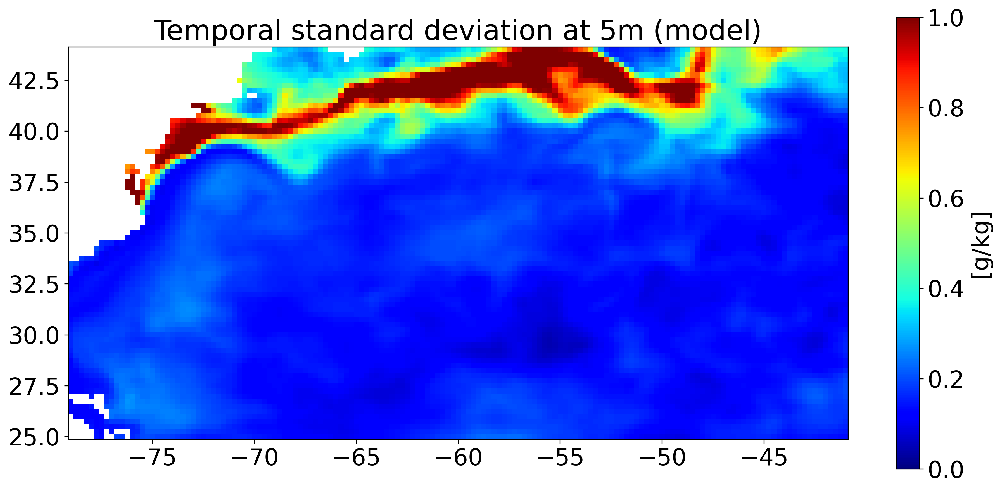

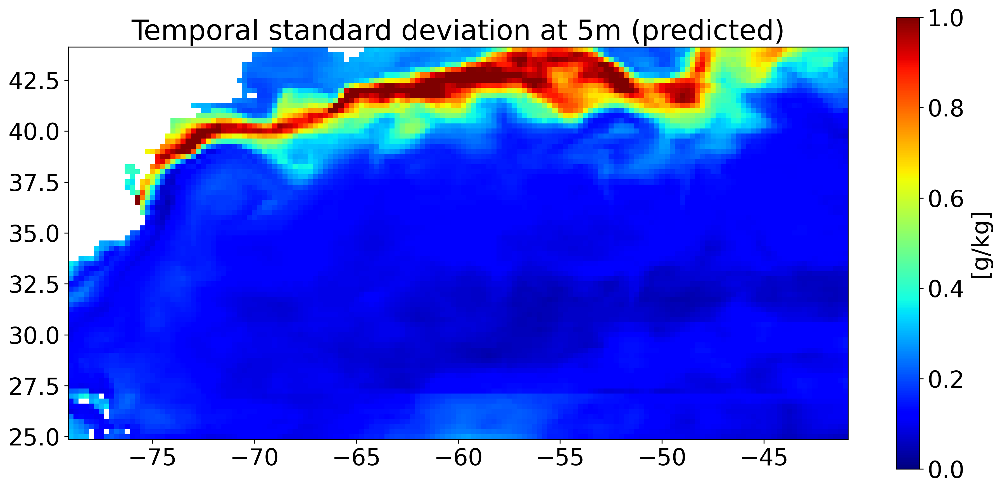

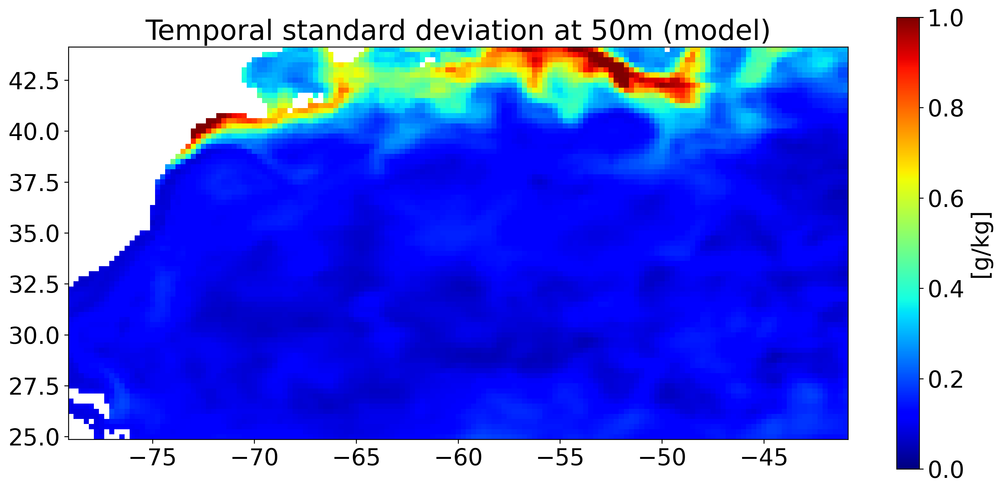

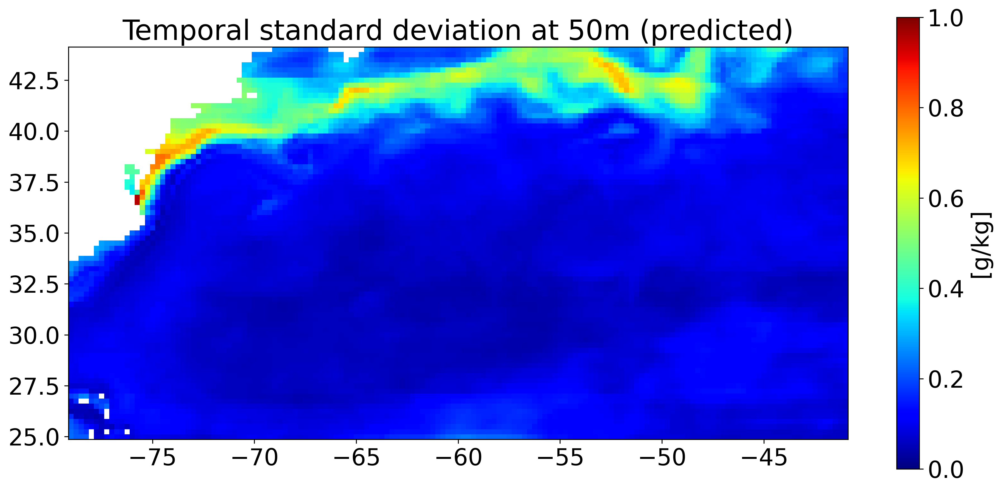

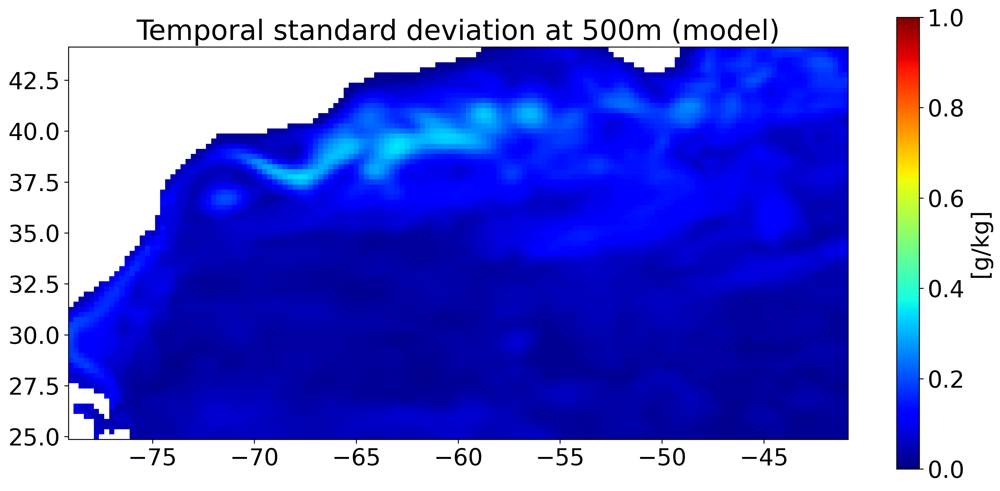

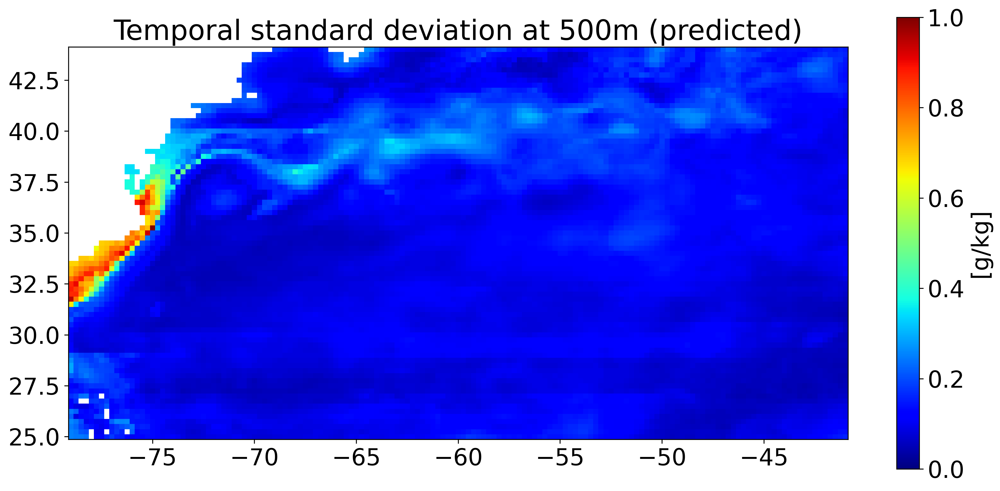

In [6]:
def compute_std_map(matrix1, matrix2):
    # Get the dimensions
    A, B, C = matrix1.shape
    
    # Initialize correlation map
    std_map1 = np.zeros((B, C))
    std_map2 = np.zeros((B, C))
    
    for i in range(B):
        for j in range(C):
            # Extract time series from both matrices
            ts1 = matrix1[:, i, j]
            ts2 = matrix2[:, i, j]
                        
            # Compute correlation coefficient
            std_map1[i, j] = np.std(ts1)
            std_map2[i, j] = np.std(ts2)
    return std_map1, std_map2
    
mm5 = np.stack(matrices_model_5_asal, axis=0)
mp5 = np.stack(matrices_pred_5_asal, axis=0)
std_5_pred, std_5_mod = compute_std_map(mp5, mm5)

plt.figure(figsize=((15,7)), dpi=300)
plt.title('Temporal standard deviation at 5m (model)')
plt.imshow(std_5_mod, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=0, vmax = 1, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]') 
plt.savefig("STD_RF_512_S_5_MOD.png")
plt.show()

plt.figure(figsize=((15,7)), dpi=300)
plt.title('Temporal standard deviation at 5m (predicted)')
plt.imshow(std_5_pred, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=0, vmax = 1, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  
plt.savefig("STD_RF_512_S_5_PRED.png")
plt.show()

# 50m
mm50 = np.stack(matrices_model_50_asal, axis=0)
mp50 = np.stack(matrices_pred_50_asal, axis=0)
std_50_pred, std_50_mod  = compute_std_map(mp50, mm50)

plt.figure(figsize=((15,7)), dpi=300)

plt.title('Temporal standard deviation at 50m (model)')
plt.imshow(std_50_mod, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=0, vmax=1, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  
plt.savefig("STD_RF_512_S_50_MOD.png")
plt.show()

plt.figure(figsize=((15,7)), dpi=300)

plt.title('Temporal standard deviation at 50m (predicted)')
plt.imshow(std_50_pred, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=0, vmax=1, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  
plt.savefig("STD_RF_512_S_50_PRED.png")
plt.show()

#500m
mm500 = np.stack(matrices_model_500_asal, axis=0)
mp500 = np.stack(matrices_pred_500_asal, axis=0)
std_500_pred, std_500_mod  = compute_std_map(mp500, mm500)

plt.figure(figsize=((15,7)), dpi=300)

plt.title('Temporal standard deviation at 500m (model)')
plt.imshow(std_500_mod, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=0, vmax=1, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  
plt.savefig("STD_RF_512_S_500_MOD.png")
plt.show()

plt.figure(figsize=((15,7)), dpi=300)

plt.title('Temporal standard deviation at 500m (predicted)')
plt.imshow(std_500_pred, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=0, vmax=1, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  
plt.savefig("STD_RF_512_S_500_PRED.png")
plt.show()

In [7]:
import scipy

def compute_mean_map(matrix1, matrix2):
    # Get the dimensions
    A, B, C = matrix1.shape
    
    # Initialize correlation map
    mean_map1 = np.zeros((B, C))
    mean_map2 = np.zeros((B, C))
    
    for i in range(B):
        for j in range(C):
            # Extract time series from both matrices
            ts1 = matrix1[:, i, j]
            ts2 = matrix2[:, i, j]
                        
            # Compute correlation coefficient
            mean_map1[i, j] = np.mean(ts1)
            mean_map2[i, j] = np.mean(ts2)
    return mean_map1, mean_map2

def mask_sig_trend(da_clim_cci,da_clim_ersst,da_var_cci,da_var_ersst,nt,q):
    nlat,nlon = da_clim_cci.shape
    mask_sig_mean=np.zeros([nlat,nlon])

    dof=2*nt-2
    t_critic=scipy.stats.t.ppf(q=q,df=dof)
    print(t_critic)
    # Compute pooled standard error of the difference in slopes
    se_diff = np.sqrt(da_var_cci**2 + da_var_ersst**2)
    t_stats=(da_clim_cci-da_clim_ersst)/se_diff
    print(mask_sig_mean.shape)

    mask_sig_mean[np.abs(t_stats) >= t_critic]=1
    print(mask_sig_mean.shape)
    return mask_sig_mean

(731, 77, 153)
(731, 77, 153)
731


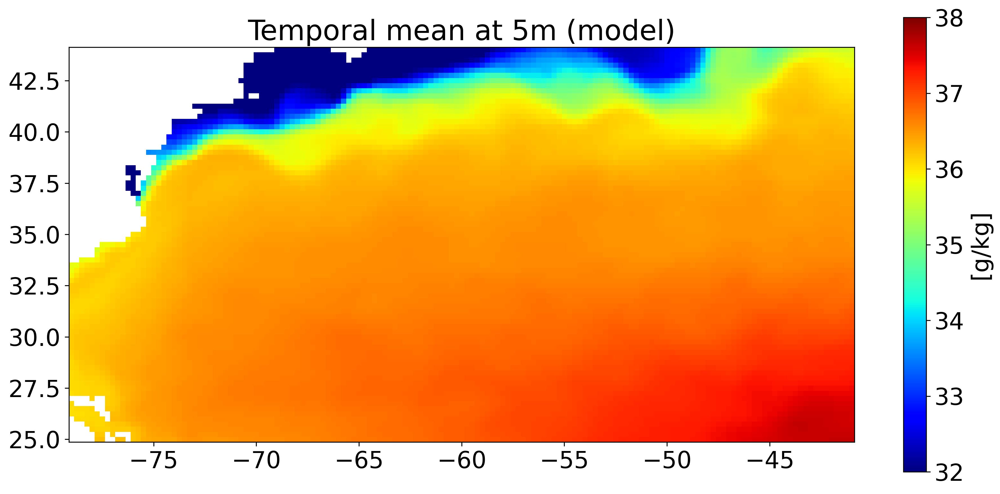

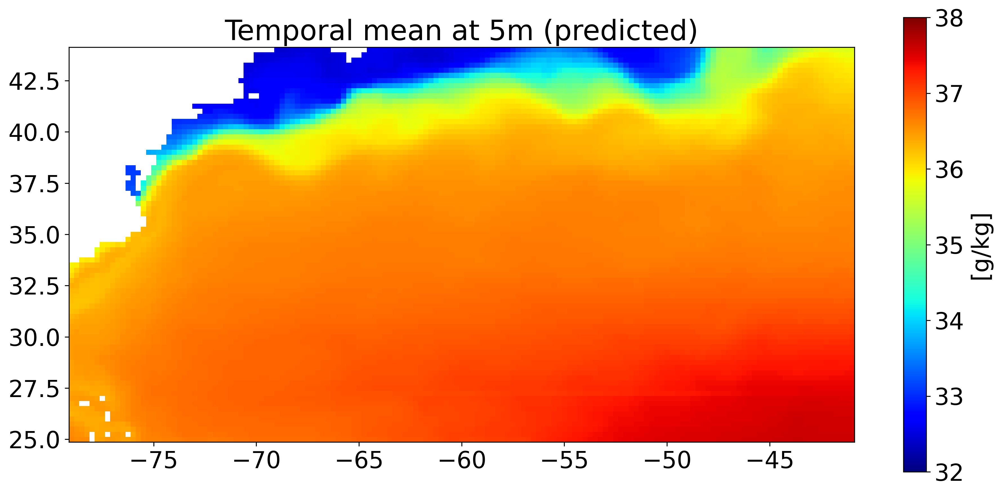

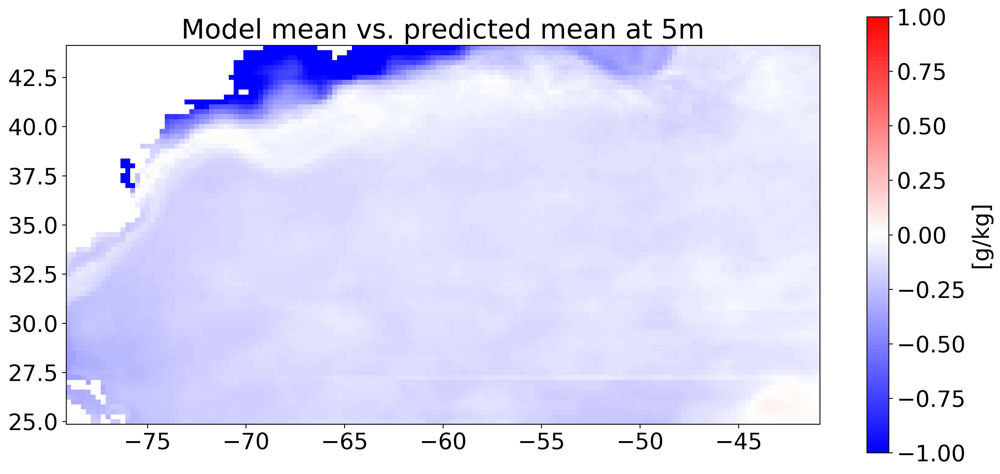

1.961590152792155
(77, 153)
(77, 153)


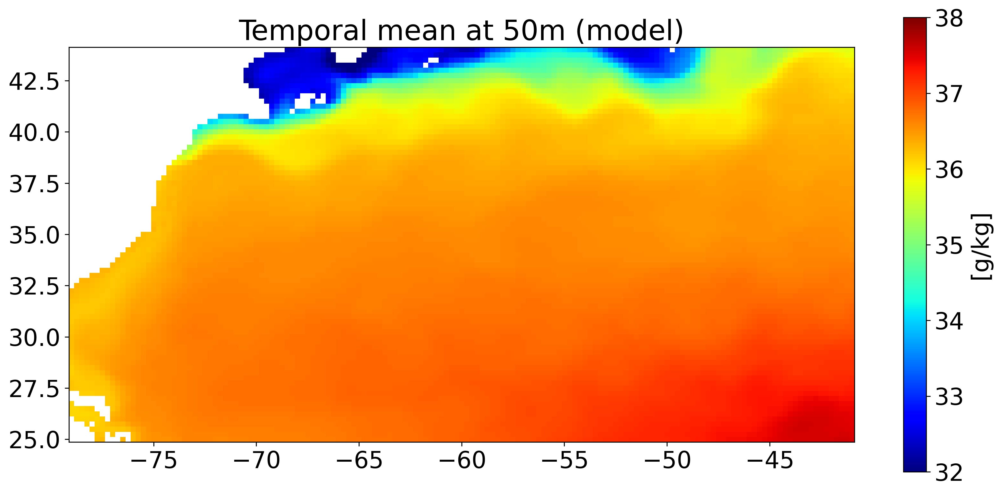

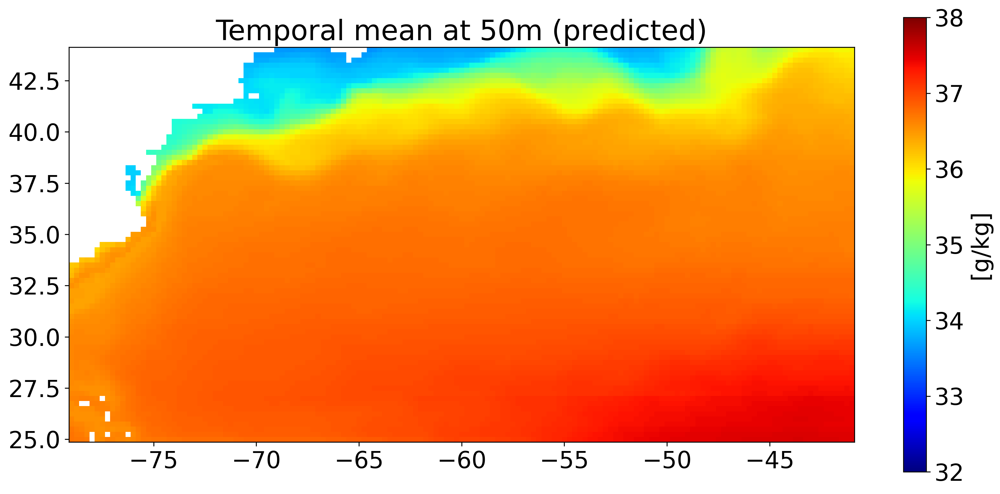

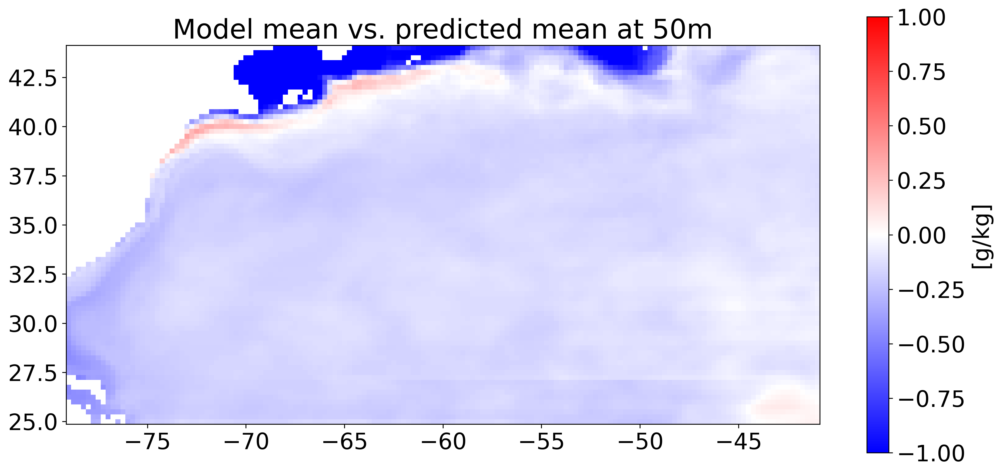

1.961590152792155
(77, 153)
(77, 153)


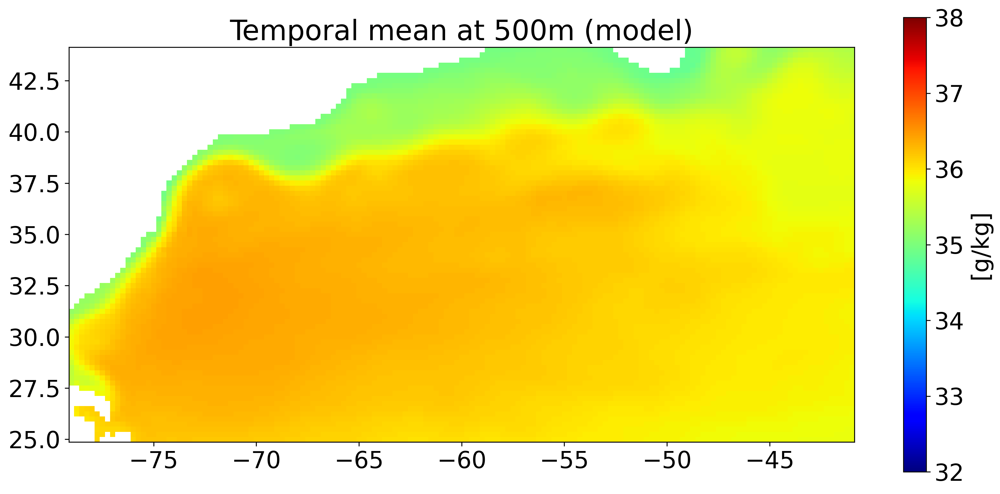

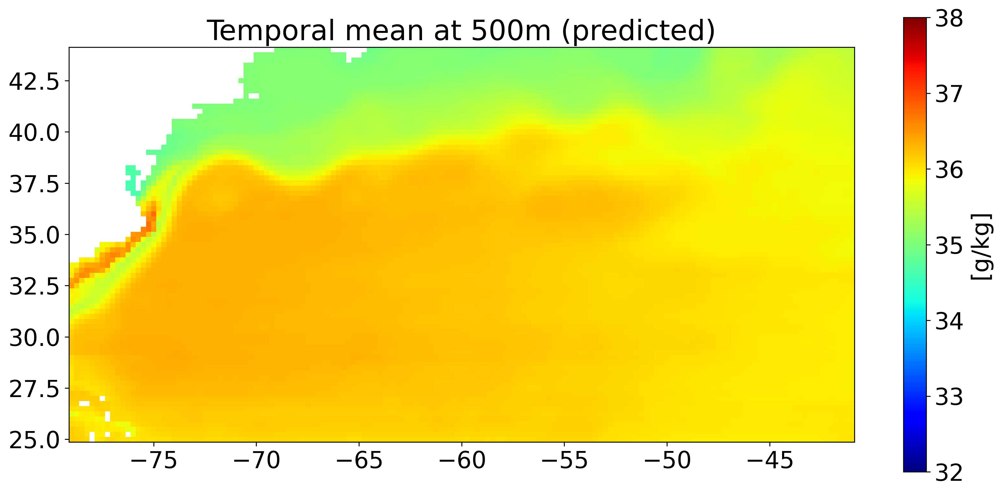

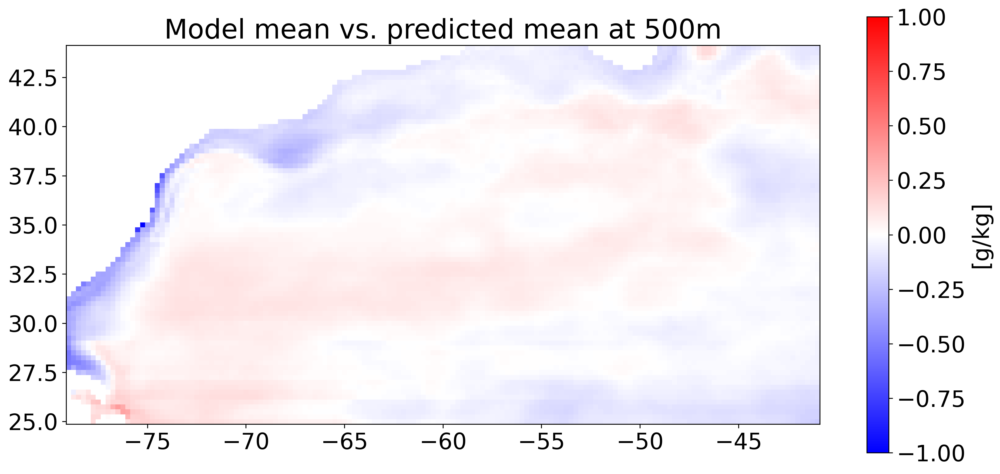

In [8]:
mm5 = np.stack(matrices_model_5_asal, axis=0)
mp5 = np.stack(matrices_pred_5_asal, axis=0)

print(np.shape(mm5))
print(np.shape(mp5))

nt, _, _ = mm5.shape
print(nt)
q=0.975

mean_5_pred, mean_5_mod = compute_mean_map(mp5, mm5)
#mask = mask_sig_trend(mean_5_mod,mean_5_pred,std_5_mod,std_5_pred,nt,q)

plt.figure(figsize=((15,7)), dpi=300)

plt.title('Temporal mean at 5m (model)')
plt.imshow(mean_5_mod, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=32, vmax=38, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  
plt.savefig("MEAN_RF_512_S_5_MOD.png")
plt.show()

plt.figure(figsize=((15,7)), dpi=300)

plt.title('Temporal mean at 5m (predicted)')
plt.imshow(mean_5_pred, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=32, vmax=38, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  
plt.savefig("MEAN_RF_512_S_5_PRED.png")
plt.show()

plt.figure(figsize=((15,7)), dpi=300)

plt.title('Model mean vs. predicted mean at 5m')
#x, y = np.meshgrid(example_r1_ds.longitude, example_r1_ds.latitude)  
#plt.contour(x, y, mask,colors='k',levels=1)
plt.imshow(mean_5_mod - mean_5_pred, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=-1, vmax=1, cmap = 'bwr')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  
plt.savefig("BIAS_RF_512_S_5_PRED.png")
plt.show()

# 50m
mm50 = np.stack(matrices_model_50_asal, axis=0)
mp50 = np.stack(matrices_pred_50_asal, axis=0)
mean_50_pred, mean_50_mod = compute_mean_map(mp50, mm50)
mask = mask_sig_trend(mean_50_mod,mean_50_pred,std_50_mod,std_50_pred,nt,q)

plt.figure(figsize=((15,7)), dpi=300)

plt.title('Temporal mean at 50m (model)')
plt.imshow(mean_50_mod, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=32, vmax=38, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  
plt.savefig("MEAN_RF_512_S_50_MOD.png")
plt.show()

plt.figure(figsize=((15,7)), dpi=300)

plt.title('Temporal mean at 50m (predicted)')
plt.imshow(mean_50_pred, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=32, vmax=38, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  
plt.savefig("MEAN_RF_512_S_50_PRED.png")
plt.show()

plt.figure(figsize=((15,7)), dpi=300)

plt.title('Model mean vs. predicted mean at 50m')
#plt.contour(x, y, mask,colors='k',levels=1)
plt.imshow(mean_50_mod - mean_50_pred, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=-1, vmax=1, cmap = 'bwr')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  
plt.savefig("BIAS_RF_512_S_50_PRED.png")
plt.show()

#500m
mm500 = np.stack(matrices_model_500_asal, axis=0)
mp500 = np.stack(matrices_pred_500_asal, axis=0)
mean_500_pred, mean_500_mod = compute_mean_map(mp500, mm500)
mask = mask_sig_trend(mean_500_mod,mean_500_pred,std_500_mod,std_500_pred,nt,q)

plt.figure(figsize=((15,7)), dpi=300)

plt.title('Temporal mean at 500m (model)')
plt.imshow(mean_500_mod, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=32, vmax=38, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  
plt.savefig("MEAN_RF_512_S_500_MOD.png")
plt.show()

plt.figure(figsize=((15,7)), dpi=300)

plt.title('Temporal mean at 500m (predicted)')
plt.imshow(mean_500_pred, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=32, vmax=38, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  
plt.savefig("MEAN_RF_512_S_500_PRED.png")
plt.show()

plt.figure(figsize=((15,7)), dpi=300)

plt.title('Model mean vs. predicted mean at 500m')
#plt.contour(x, y, mask,colors='k',levels=1)
plt.imshow(mean_500_mod - mean_500_pred, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=-1, vmax=1, cmap = 'bwr')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  
plt.savefig("BIAS_RF_512_S_500_PRED.png")
plt.show()

/home/ainagarcia/anaconda3/lib/python3.11/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/ainagarcia/anaconda3/lib/python3.11/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


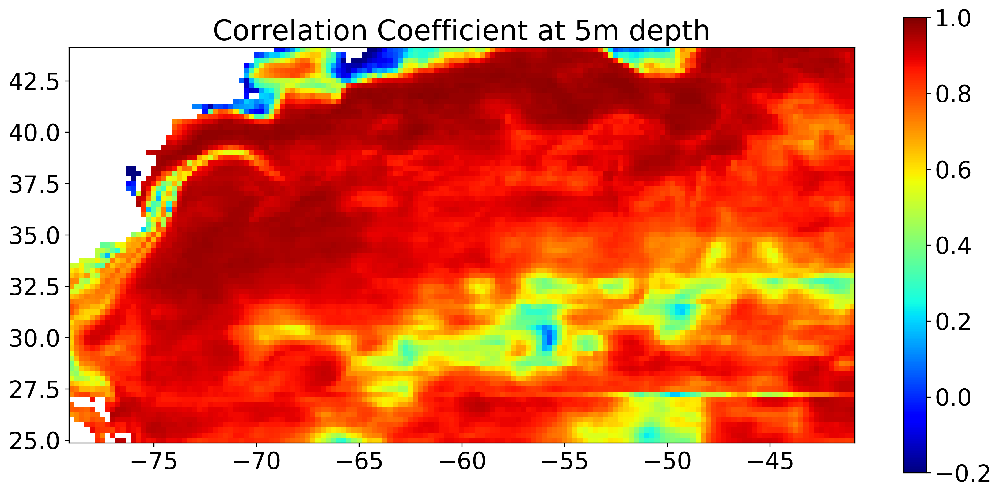

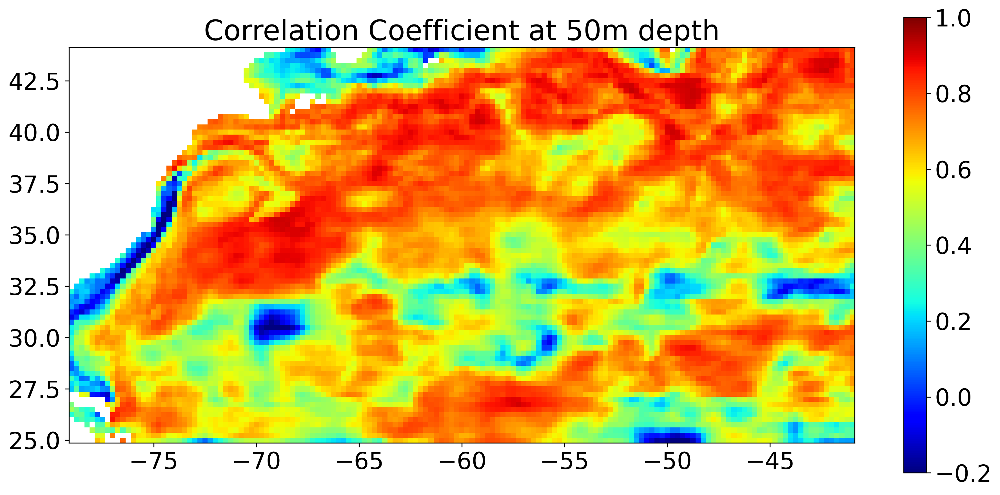

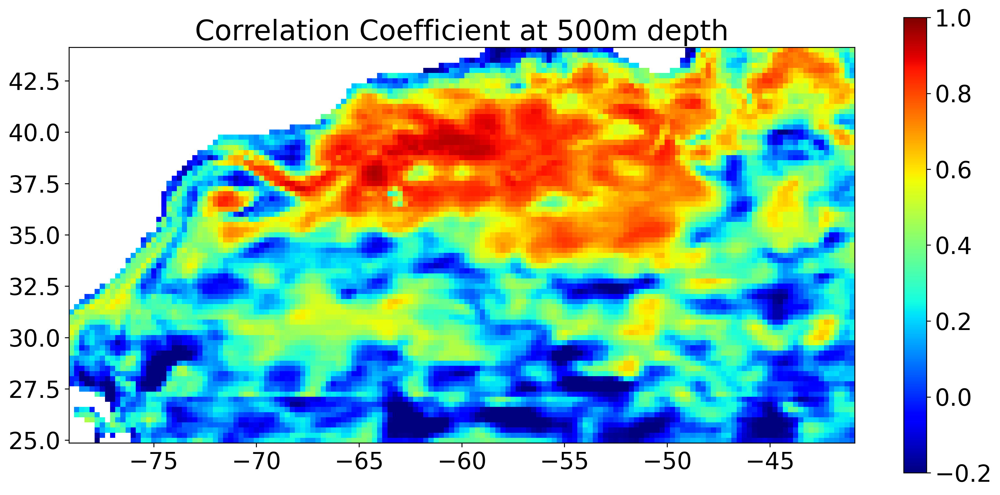

In [9]:
import numpy as np

def compute_correlation_map(matrix1, matrix2):
    # Get the dimensions
    A, B, C = matrix1.shape
    
    # Initialize correlation map
    correlation_map = np.zeros((B, C))
    
    for i in range(B):
        for j in range(C):
            # Extract time series from both matrices
            ts1 = matrix1[:, i, j]
            ts2 = matrix2[:, i, j]
            
            # Replace NaN values with 0
            ts1 = np.nan_to_num(ts1, nan=0)
            ts2 = np.nan_to_num(ts2, nan=0)
            
            # Compute correlation coefficient
            correlation_map[i, j] = np.corrcoef(ts1, ts2)[0, 1]
    
    return correlation_map
    
mm5 = np.stack(matrices_model_5_asal, axis=0)
mp5 = np.stack(matrices_pred_5_asal, axis=0)

correlation_coefficients_5 = compute_correlation_map(mm5, mp5)

plt.figure(figsize=((15,7)), dpi=300)

plt.title('Correlation Coefficient at 5m depth')
plt.imshow(correlation_coefficients_5, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], vmin=-0.2, vmax=1, origin='lower', cmap = 'jet')
plt.colorbar()
plt.savefig("CORR_RF_512_S_5.png")
plt.show()

mm50 = np.stack(matrices_model_50_asal, axis=0)
mp50 = np.stack(matrices_pred_50_asal, axis=0)
correlation_coefficients_50 = compute_correlation_map(mm50, mp50)

plt.figure(figsize=((15,7)), dpi=300)

plt.title('Correlation Coefficient at 50m depth')
plt.imshow(correlation_coefficients_50, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], vmin=-0.2, vmax=1, origin='lower', cmap = 'jet')
plt.colorbar()
plt.savefig("CORR_RF_512_S_50.png")
plt.show()

mm500 = np.stack(matrices_model_500_asal, axis=0)
mp500 = np.stack(matrices_pred_500_asal, axis=0)
correlation_coefficients_500 = compute_correlation_map(mm500, mp500)

plt.figure(figsize=((15,7)), dpi=300)

plt.title('Correlation Coefficient at 500m depth')
plt.imshow(correlation_coefficients_500, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], vmin=-0.2, vmax=1, origin='lower', cmap = 'jet')
plt.colorbar()
plt.savefig("CORR_RF_512_S_500.png")

plt.show()

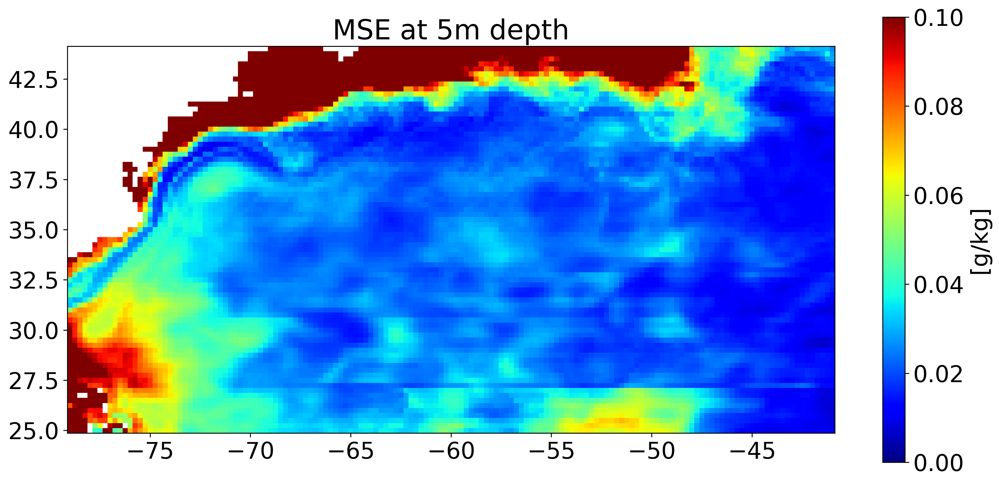

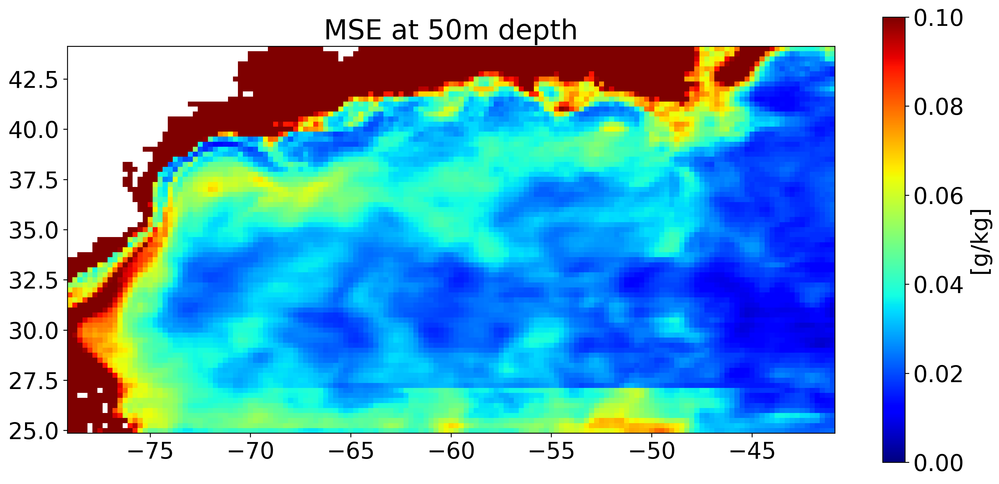

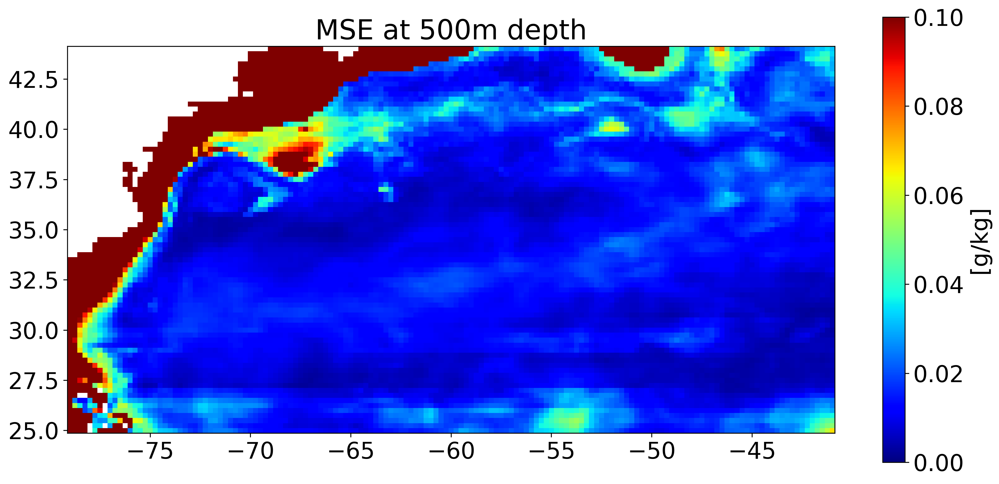

In [10]:
import numpy as np
import sklearn
from sklearn.metrics import mean_squared_error

def compute_MSE_map(matrix1, matrix2):
    # Get the dimensions
    A, B, C = matrix1.shape
    
    # Initialize correlation map
    correlation_map = np.zeros((B, C))
    
    for i in range(B):
        for j in range(C):
            # Extract time series from both matrices
            ts1 = matrix1[:, i, j]
            ts2 = matrix2[:, i, j]
            
            # Replace NaN values with 0
            ts1 = np.nan_to_num(ts1, nan=0)
            ts2 = np.nan_to_num(ts2, nan=0)
            
            # Compute correlation coefficient
            correlation_map[i, j] = sklearn.metrics.mean_squared_error(ts1, ts2)
            correlation_map[correlation_map==0] = np.nan

    return correlation_map
    
mm5 = np.stack(matrices_model_5_asal, axis=0)
mp5 = np.stack(matrices_pred_5_asal, axis=0)
mse_5 = compute_MSE_map(mm5, mp5)

plt.figure(figsize=((15,7)), dpi=300)

plt.title('MSE at 5m depth')
plt.imshow(mse_5, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], vmin=0, vmax=0.1, origin='lower', cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  
plt.savefig("MSE_RF_512_S_5.png")
plt.show()

mm50 = np.stack(matrices_model_50_asal, axis=0)
mp50 = np.stack(matrices_pred_50_asal, axis=0)
mse_50 = compute_MSE_map(mm50, mp50)

plt.figure(figsize=((15,7)), dpi=300)

plt.title('MSE at 50m depth')
plt.imshow(mse_50, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], vmin=0, vmax=0.1, origin='lower', cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  
plt.savefig("MSE_RF_512_S_50.png")
plt.show()

mm500 = np.stack(matrices_model_500_asal, axis=0)
mp500 = np.stack(matrices_pred_500_asal, axis=0)
mse_500 = compute_MSE_map(mm500, mp500)

plt.figure(figsize=((15,7)), dpi=300)

plt.title('MSE at 500m depth')
plt.imshow(mse_500, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], vmin=0, vmax=0.1, origin='lower', cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  
plt.savefig("MSE_RF_512_S_500.png")
plt.show()

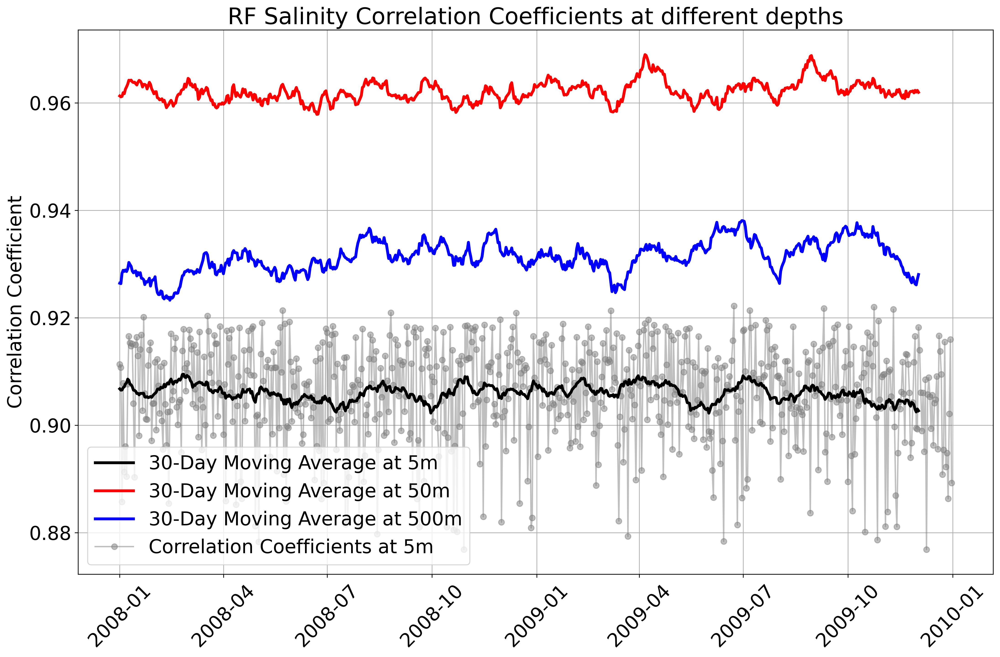

In [11]:
def calculate_correlation_time_series(matrix1, matrix2):
    A, B, C = matrix1.shape
    
    # Initialize correlation map
    corr_ts = np.zeros(A)
    
    for i in range(A):
        im1 = matrix1[i, :, :]
        im2 = matrix2[i, :, :]
        
        # Flatten the images to 1D arrays
        image1_flat = im1.flatten()
        image2_flat = im2.flatten()
    
        # Create a mask to identify non-NaN positions in both images
        valid_mask = ~np.isnan(image1_flat) & ~np.isnan(image2_flat)
        
        # Filter out the NaN positions
        image1_filtered = image1_flat[valid_mask]
        image2_filtered = image2_flat[valid_mask]
        
        if len(image1_filtered) == 0 or len(image2_filtered) == 0:
            # If there are no valid data points, set correlation to NaN
            corr_ts[i] = np.nan
        else:
            # Calculate the Pearson correlation coefficient
            correlation_matrix = np.corrcoef(image1_filtered, image2_filtered)
            corr_ts[i] = correlation_matrix[0, 1]
    
    return corr_ts

import matplotlib.pyplot as plt
import pandas as pd

window_size = 30

mm5 = np.stack(matrices_model_5_asal, axis=0)
mp5 = np.stack(matrices_pred_5_asal, axis=0)
mm50 = np.stack(matrices_model_50_asal, axis=0)
mp50 = np.stack(matrices_pred_50_asal, axis=0)
mm500 = np.stack(matrices_model_500_asal, axis=0)
mp500 = np.stack(matrices_pred_500_asal, axis=0)

date_range = pd.date_range(start='2008-01-01', end='2009-12-31')

correlation_coefficients_ts_5 = calculate_correlation_time_series(mm5, mp5)  # Replace with your array of correlation coefficients
correlation_coefficients_ts_50 = calculate_correlation_time_series(mm50, mp50)  # Replace with your array of correlation coefficients
correlation_coefficients_ts_500 = calculate_correlation_time_series(mm500, mp500)  # Replace with your array of correlation coefficients


moving_average_5 = np.convolve(correlation_coefficients_ts_5, np.ones(window_size)/window_size, mode='valid')
moving_average_50 = np.convolve(correlation_coefficients_ts_50, np.ones(window_size)/window_size, mode='valid')
moving_average_500 = np.convolve(correlation_coefficients_ts_500, np.ones(window_size)/window_size, mode='valid')

plt.figure(figsize=(15, 10), dpi=300)
plt.plot(date_range[:-window_size+1], moving_average_5, color='black', linewidth=3,  linestyle='-', label='30-Day Moving Average at 5m', zorder = 5)
plt.plot(date_range[:-window_size+1], moving_average_50, color='red', linewidth=3,  linestyle='-', label='30-Day Moving Average at 50m', zorder = 4)
plt.plot(date_range[:-window_size+1], moving_average_500, color='blue', linewidth=3,  linestyle='-', label='30-Day Moving Average at 500m', zorder = 3)
plt.plot(date_range, correlation_coefficients_ts_5, marker='o', linestyle='-', color='grey', label='Correlation Coefficients at 5m', alpha = 0.5)
plt.title('RF Salinity Correlation Coefficients at different depths')
plt.ylabel('Correlation Coefficient')
plt.grid(True)
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.savefig("CORR_TS_RF_512_S.png")
# Show the plot
plt.show()

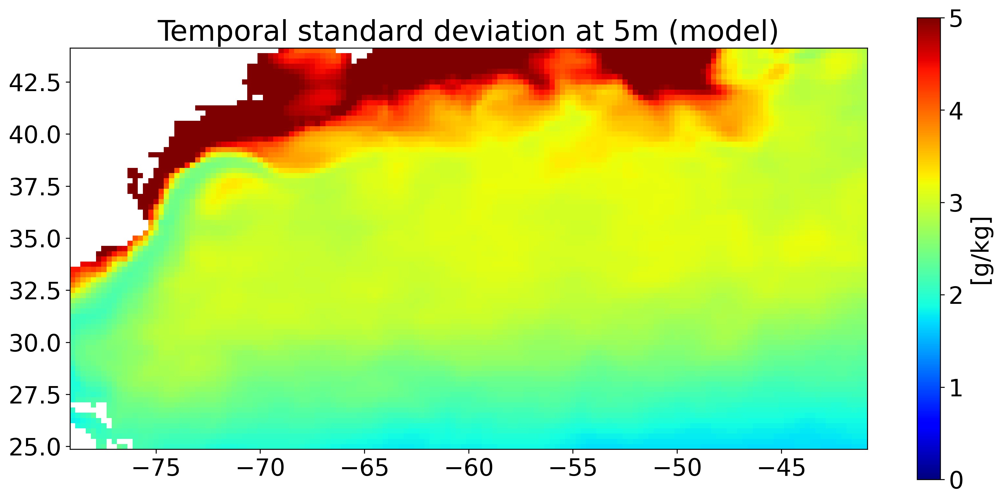

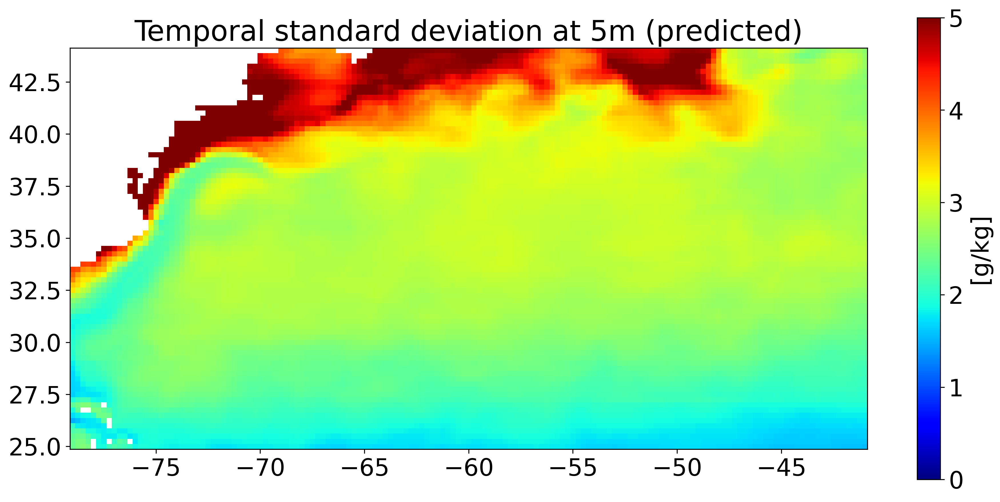

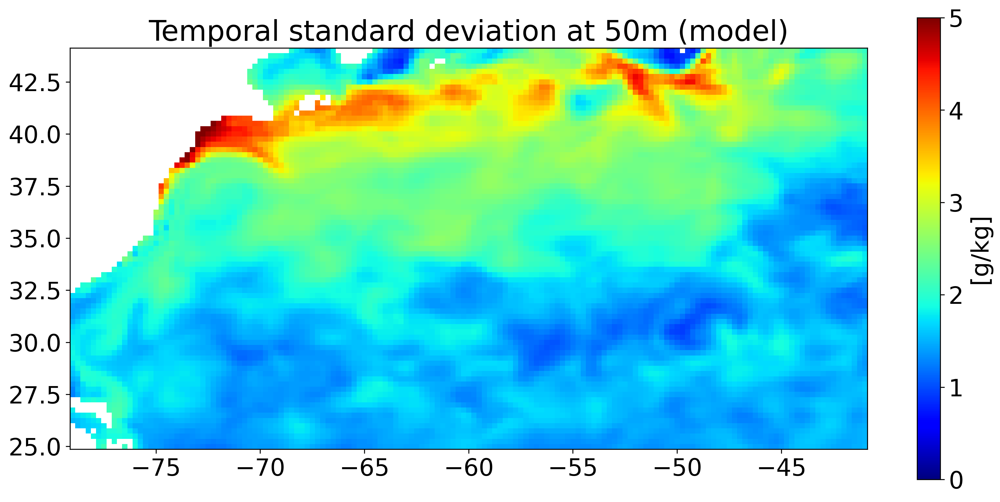

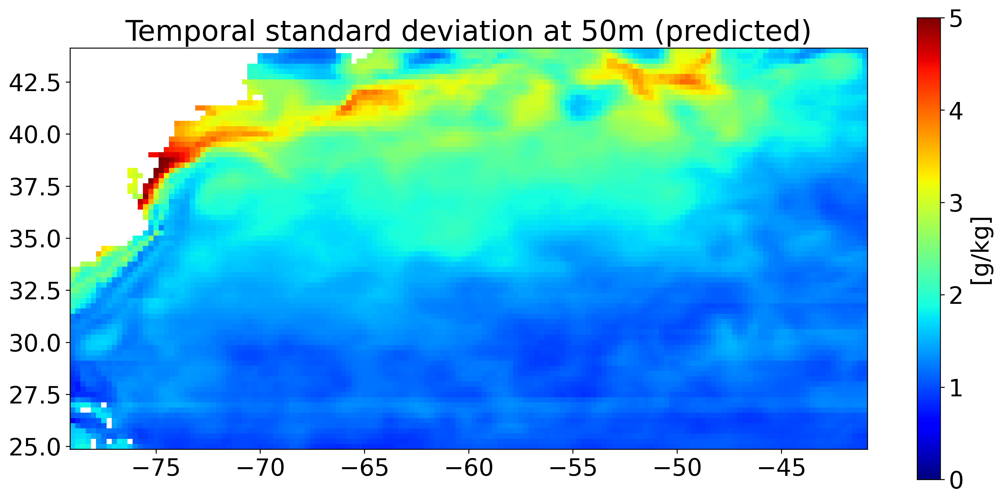

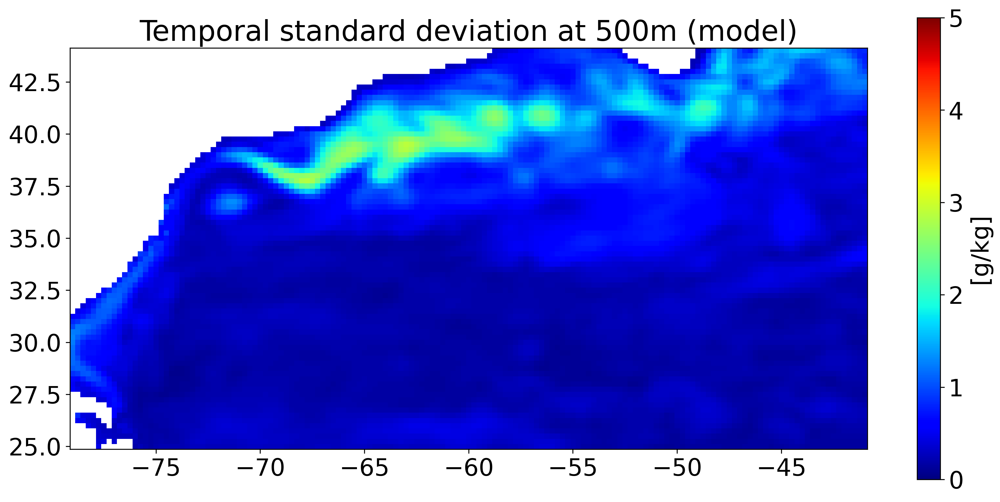

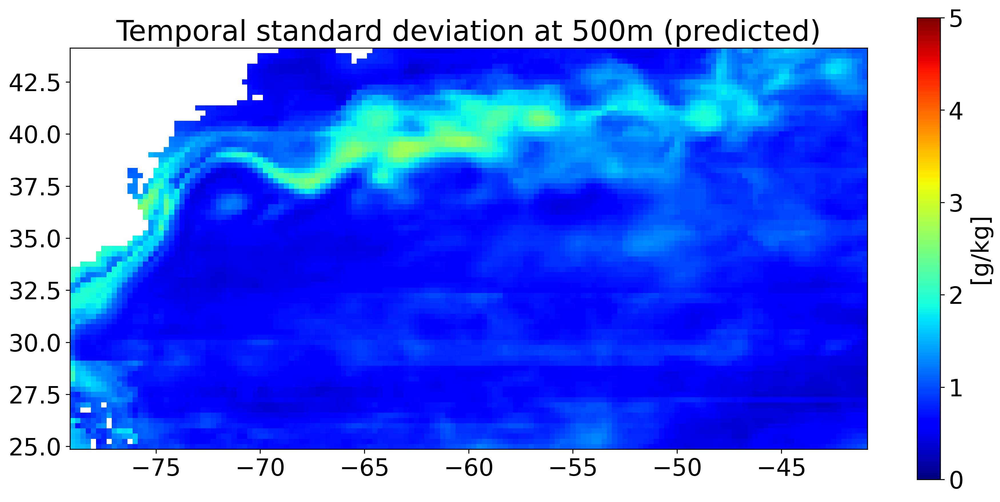

In [12]:
mm5 = np.stack(matrices_model_5_ctemp, axis=0)
mp5 = np.stack(matrices_pred_5_ctemp, axis=0)

std_ctemp_5_pred, std_ctemp_5_mod = compute_std_map(mp5, mm5)

plt.figure(figsize=((15,7)), dpi=300)

plt.title('Temporal standard deviation at 5m (model)')
plt.imshow(std_ctemp_5_mod, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=0, vmax = 5, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  
plt.savefig("STD_RF_512_T_5_MOD.png")
plt.show()

plt.figure(figsize=((15,7)), dpi=300)

plt.title('Temporal standard deviation at 5m (predicted)')
plt.imshow(std_ctemp_5_pred, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=0, vmax =5, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  
plt.savefig("STD_RF_512_T_5_PRED.png")
plt.show()

# 50m
mm50 = np.stack(matrices_model_50_ctemp, axis=0)
mp50 = np.stack(matrices_pred_50_ctemp, axis=0)

std_ctemp_50_pred, std_ctemp_50_mod  = compute_std_map(mp50, mm50)

plt.figure(figsize=((15,7)), dpi=300)

plt.title('Temporal standard deviation at 50m (model)')
plt.imshow(std_ctemp_50_mod, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=0, vmax=5, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  
plt.savefig("STD_RF_512_T_50_MOD.png")
plt.show()

plt.figure(figsize=((15,7)), dpi=300)

plt.title('Temporal standard deviation at 50m (predicted)')
plt.imshow(std_ctemp_50_pred, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=0, vmax=5, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  
plt.savefig("STD_RF_512_T_50_PRED.png")
plt.show()

#500m
mm500 = np.stack(matrices_model_500_ctemp, axis=0)
mp500 = np.stack(matrices_pred_500_ctemp, axis=0)

std_ctemp_500_pred, std_ctemp_500_mod  = compute_std_map(mp500, mm500)

plt.figure(figsize=((15,7)), dpi=300)

plt.title('Temporal standard deviation at 500m (model)')
plt.imshow(std_ctemp_500_mod, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=0, vmax= 5, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  
plt.savefig("STD_RF_512_T_500_MOD.png")
plt.show()

plt.figure(figsize=((15,7)), dpi=300)

plt.title('Temporal standard deviation at 500m (predicted)')
plt.imshow(std_ctemp_500_pred, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=0, vmax=5, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  
plt.savefig("STD_RF_512_T_500_PRED.png")
plt.show()

(731, 77, 153)
(731, 77, 153)


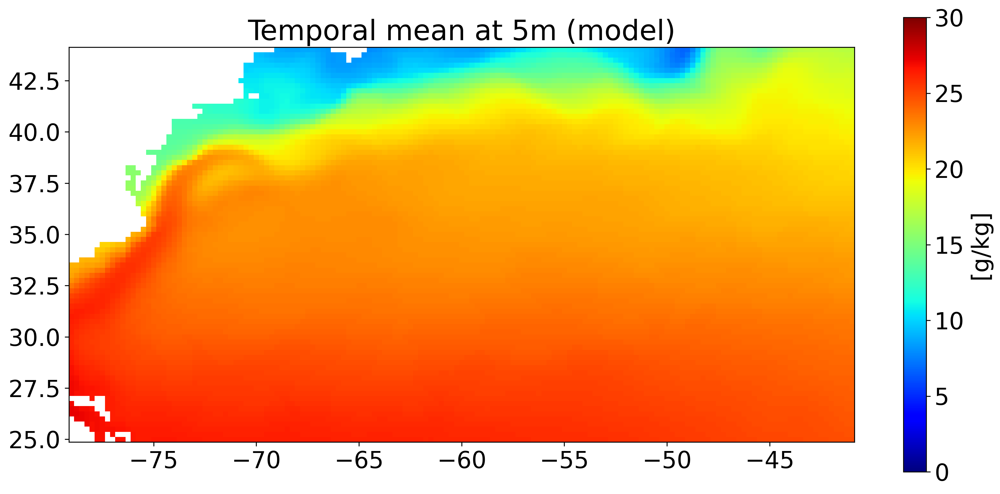

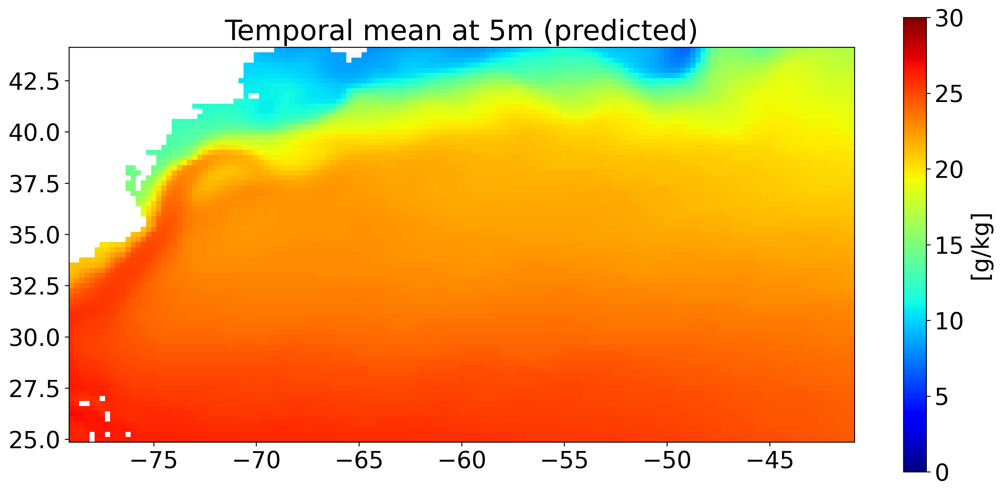

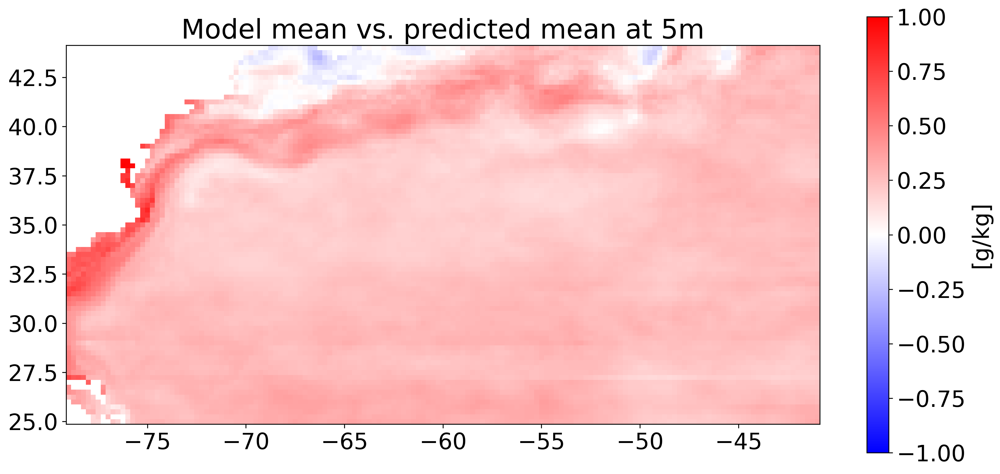

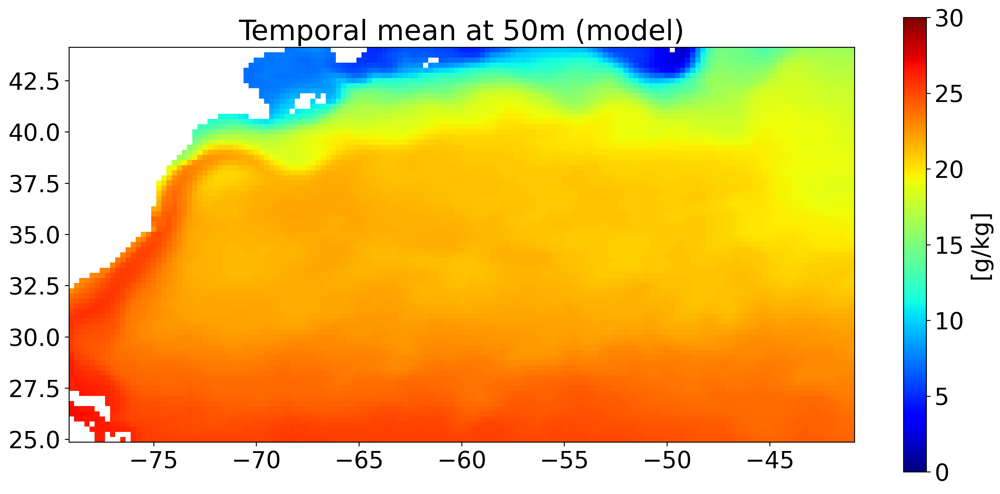

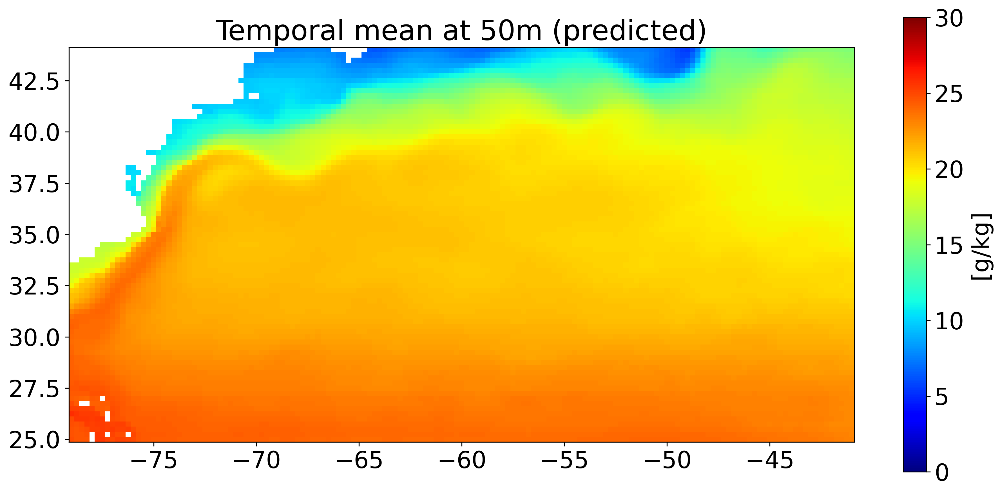

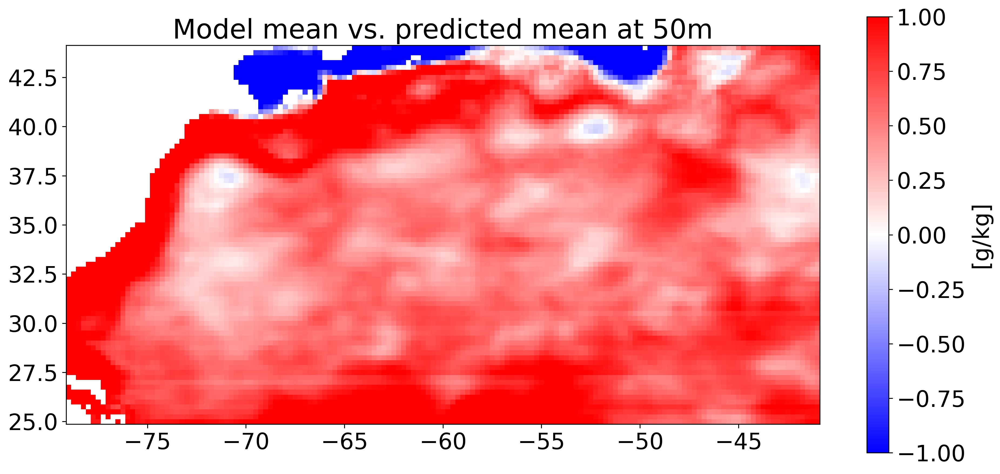

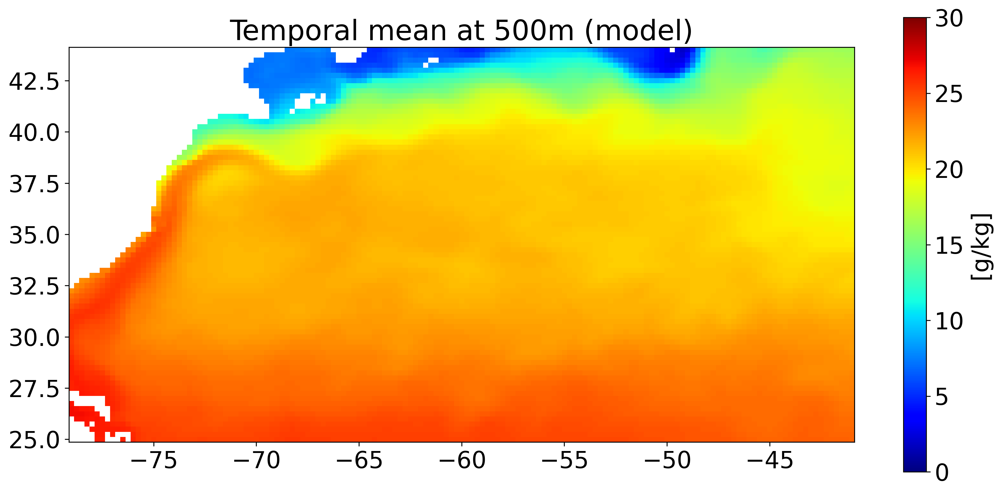

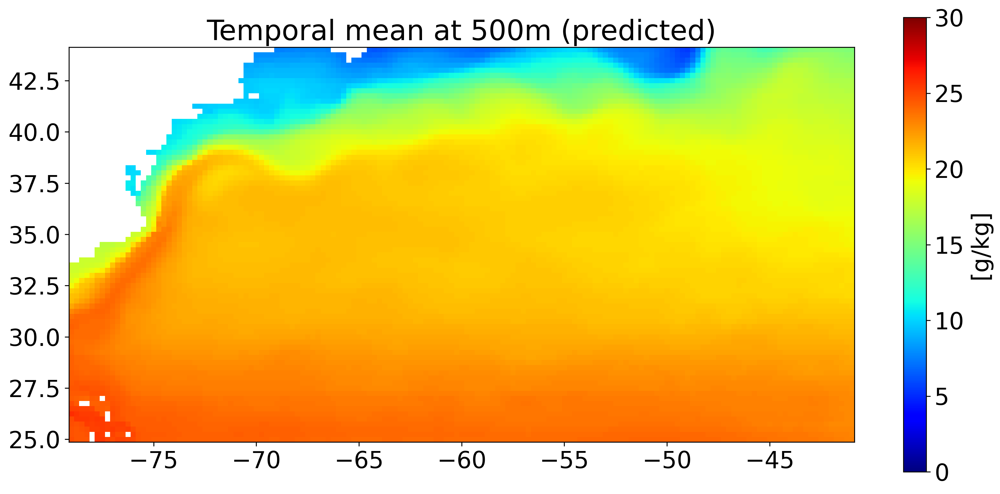

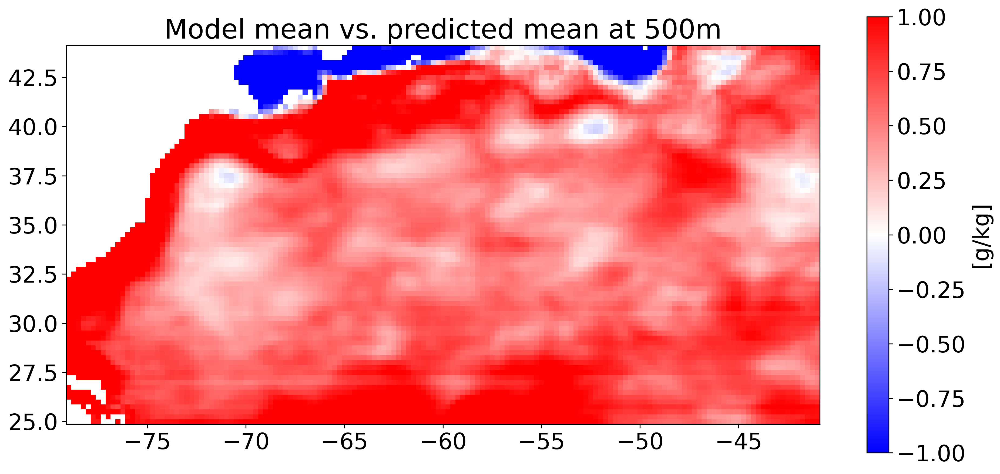

In [13]:
mm5 = np.stack(matrices_model_5_ctemp, axis=0)
mp5 = np.stack(matrices_pred_5_ctemp, axis=0)

print(np.shape(mm5))
print(np.shape(mp5))


mean_ctemp_5_pred, mean_ctemp_5_mod = compute_mean_map(mp5, mm5)

plt.figure(figsize=((15,7)), dpi=300)

plt.title('Temporal mean at 5m (model)')
plt.imshow(mean_ctemp_5_mod, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=0, vmax=30, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  
plt.savefig("MEAN_RF_512_T_5_MOD.png")
plt.show()

plt.figure(figsize=((15,7)), dpi=300)

plt.title('Temporal mean at 5m (predicted)')
plt.imshow(mean_ctemp_5_pred, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=0, vmax=30, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  
plt.savefig("MEAN_RF_512_T_5_PRED.png")
plt.show()

plt.figure(figsize=((15,7)), dpi=300)

plt.title('Model mean vs. predicted mean at 5m')
plt.imshow(mean_ctemp_5_mod - mean_ctemp_5_pred, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=-1, vmax=1, cmap = 'bwr')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  
plt.savefig("BIAS_RF_512_T_5_PRED.png")
plt.show()

# 50m
mm50 = np.stack(matrices_model_50_ctemp, axis=0)
mp50 = np.stack(matrices_pred_50_ctemp, axis=0)

mean_ctemp_50_pred, mean_ctemp_50_mod = compute_mean_map(mp50, mm50)

plt.figure(figsize=((15,7)), dpi=300)

plt.title('Temporal mean at 50m (model)')
plt.imshow(mean_ctemp_50_mod, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=0, vmax=30, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  
plt.savefig("MEAN_RF_512_T_50_MOD.png")
plt.show()

plt.figure(figsize=((15,7)), dpi=300)

plt.title('Temporal mean at 50m (predicted)')
plt.imshow(mean_ctemp_50_pred, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=0, vmax=30, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  
plt.savefig("MEAN_RF_512_T_50_PRED.png")
plt.show()

plt.figure(figsize=((15,7)), dpi=300)

plt.title('Model mean vs. predicted mean at 50m')
plt.imshow(mean_ctemp_50_mod - mean_ctemp_50_pred, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=-1, vmax=1, cmap = 'bwr')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  
plt.savefig("BIAS_RF_512_T_50_PRED.png")
plt.show()

#500m
mm500 = np.stack(matrices_model_500_ctemp, axis=0)
mp500 = np.stack(matrices_pred_500_ctemp, axis=0)

mean_ctemp_500_pred, mean_ctemp_500_mod = compute_mean_map(mp50, mm50)

plt.figure(figsize=((15,7)), dpi=300)

plt.title('Temporal mean at 500m (model)')
plt.imshow(mean_ctemp_500_mod, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=0, vmax=30, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  
plt.savefig("MEAN_RF_512_T_500_MOD.png")
plt.show()

plt.figure(figsize=((15,7)), dpi=300)

plt.title('Temporal mean at 500m (predicted)')
plt.imshow(mean_ctemp_500_pred, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=0, vmax=30, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  
plt.savefig("MEAN_RF_512_T_500_PRED.png")
plt.show()

plt.figure(figsize=((15,7)), dpi=300)

plt.title('Model mean vs. predicted mean at 500m')
plt.imshow(mean_ctemp_500_mod - mean_ctemp_500_pred, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=-1, vmax=1, cmap = 'bwr')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  
plt.savefig("BIAS_RF_512_T_500_PRED.png")
plt.show()

/home/ainagarcia/anaconda3/lib/python3.11/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/ainagarcia/anaconda3/lib/python3.11/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


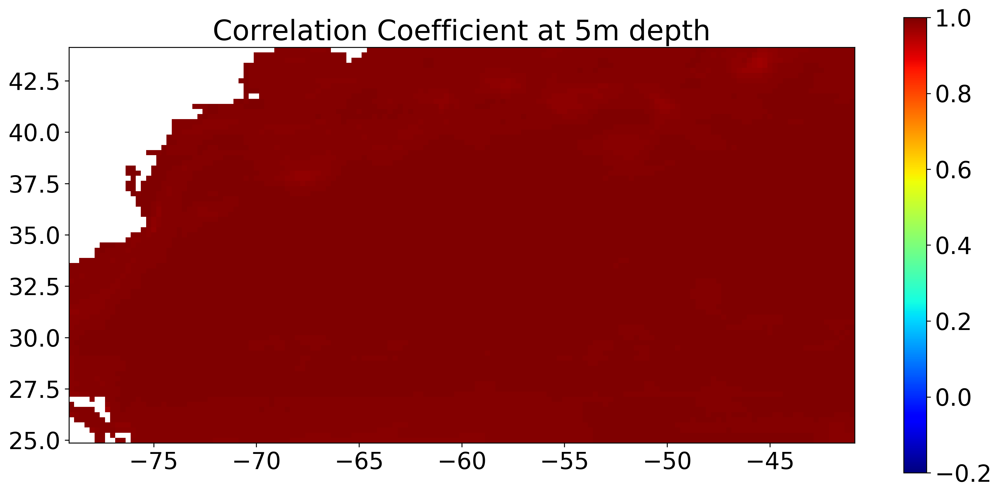

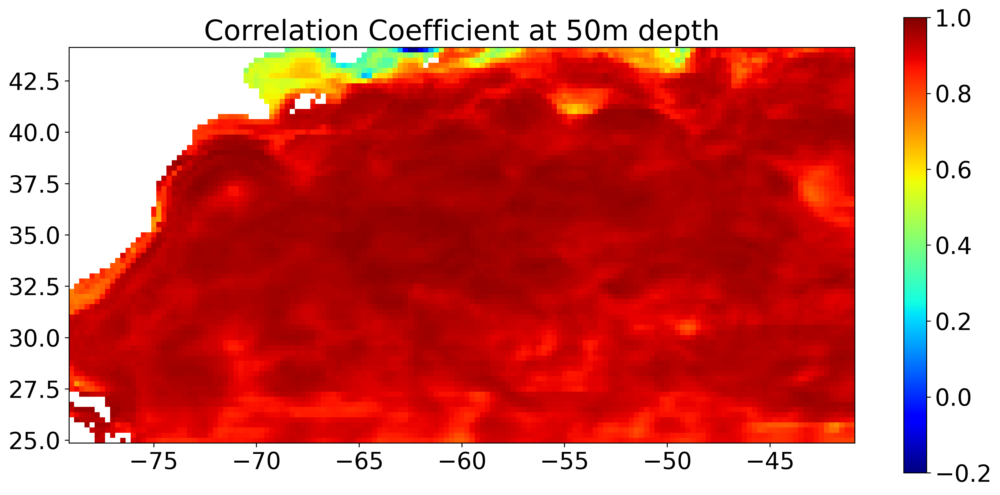

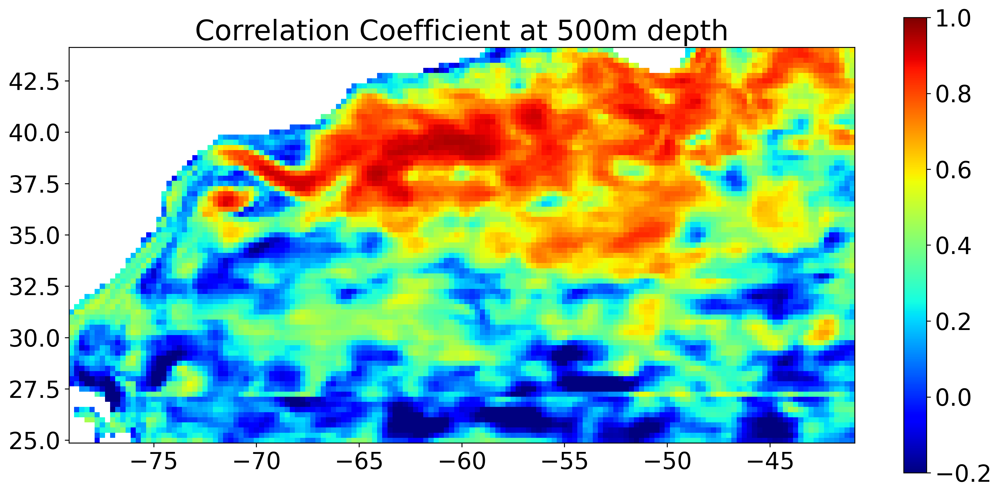

In [14]:

mm5 = np.stack(matrices_model_5_ctemp, axis=0)
mp5 = np.stack(matrices_pred_5_ctemp, axis=0)
correlation_coefficients_temp_5 = compute_correlation_map(mm5, mp5)

plt.figure(figsize=((15,7)), dpi=300)

plt.title('Correlation Coefficient at 5m depth')
plt.imshow(correlation_coefficients_temp_5, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], vmin=-0.2, vmax=1, origin='lower', cmap = 'jet')
plt.colorbar()
plt.savefig("CORR_RF_512_T_5.png")
plt.show()

mm50 = np.stack(matrices_model_50_ctemp, axis=0)
mp50 = np.stack(matrices_pred_50_ctemp, axis=0)
correlation_coefficients_temp_50 = compute_correlation_map(mm50, mp50)

plt.figure(figsize=((15,7)), dpi=300)

plt.title('Correlation Coefficient at 50m depth')
plt.imshow(correlation_coefficients_temp_50, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], vmin=-0.2, vmax=1, origin='lower', cmap = 'jet')
plt.colorbar()
plt.savefig("CORR_RF_512_T_50.png")
plt.show()

mm500 = np.stack(matrices_model_500_ctemp, axis=0)
mp500 = np.stack(matrices_pred_500_ctemp, axis=0)
correlation_coefficients_temp_500 = compute_correlation_map(mm500, mp500)

plt.figure(figsize=((15,7)), dpi=300)

plt.title('Correlation Coefficient at 500m depth')
plt.imshow(correlation_coefficients_temp_500, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], vmin=-0.2, vmax=1, origin='lower', cmap = 'jet')
plt.colorbar()
plt.savefig("CORR_RF_512_T_500.png")

plt.show()

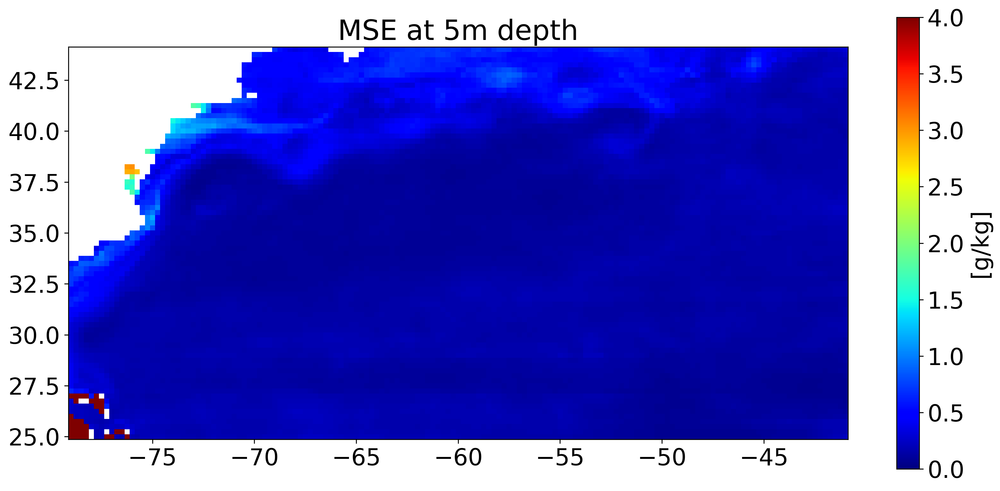

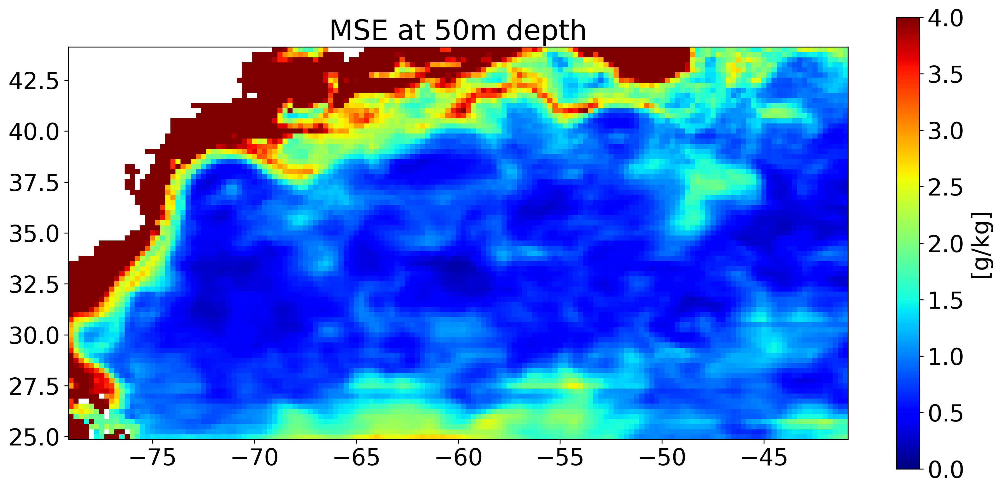

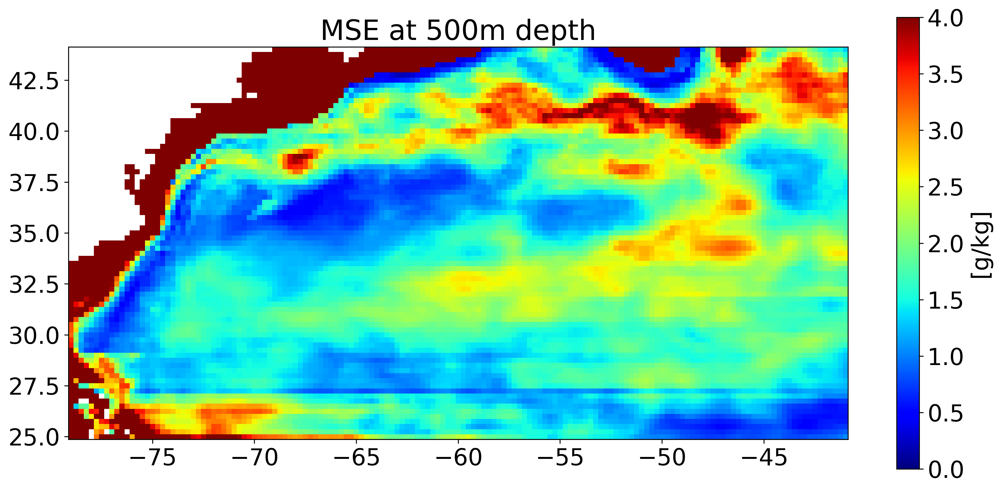

In [15]:
mm5 = np.stack(matrices_model_5_ctemp, axis=0)
mp5 = np.stack(matrices_pred_5_ctemp, axis=0)
mse_temp_5 = compute_MSE_map(mm5, mp5)

plt.figure(figsize=((15,7)), dpi=300)

plt.title('MSE at 5m depth')
plt.imshow(mse_temp_5, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], vmin=0, vmax=4, origin='lower', cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  
plt.savefig("MSE_RF_512_T_5.png")
plt.show()

mm50 = np.stack(matrices_model_50_ctemp, axis=0)
mp50 = np.stack(matrices_pred_50_ctemp, axis=0)
mse_temp_50 = compute_MSE_map(mm50, mp50)

plt.figure(figsize=((15,7)), dpi=300)

plt.title('MSE at 50m depth')
plt.imshow(mse_temp_50, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], vmin=0, vmax=4, origin='lower', cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  
plt.savefig("MSE_RF_512_T_50.png")
plt.show()

mm500 = np.stack(matrices_model_500_ctemp, axis=0)
mp500 = np.stack(matrices_pred_500_ctemp, axis=0)
mse_temp_500 = compute_MSE_map(mm500, mp500)

plt.figure(figsize=((15,7)), dpi=300)

plt.title('MSE at 500m depth')
plt.imshow(mse_temp_500, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], vmin=0, vmax=4, origin='lower', cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  
plt.savefig("MSE_RF_512_T_500.png")
plt.show()

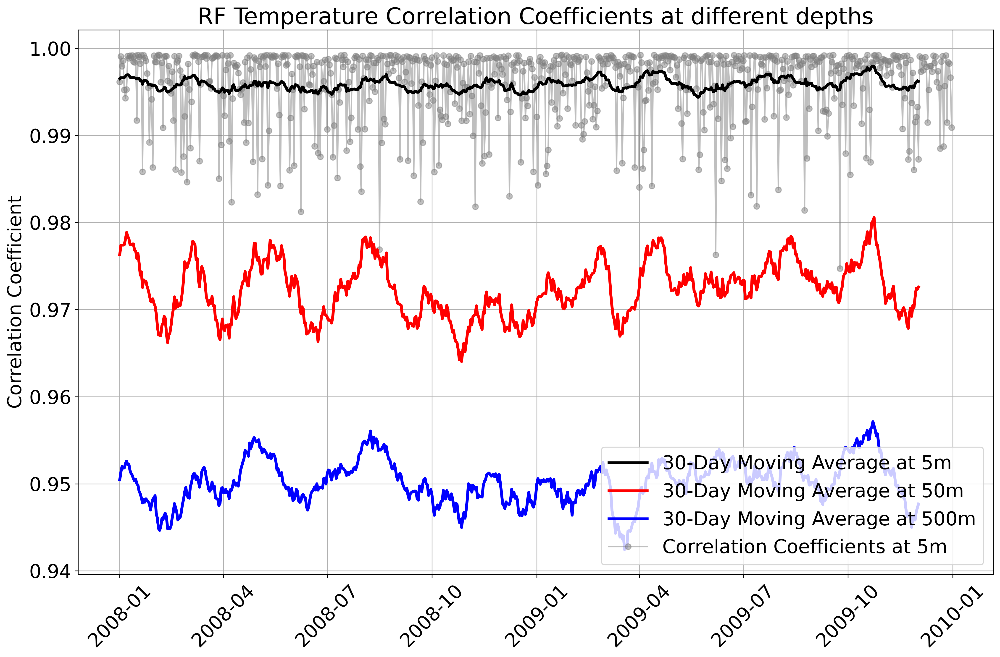

In [16]:
window_size = 30

mm5 = np.stack(matrices_model_5_ctemp, axis=0)
mp5 = np.stack(matrices_pred_5_ctemp, axis=0)
mm50 = np.stack(matrices_model_50_ctemp, axis=0)
mp50 = np.stack(matrices_pred_50_ctemp, axis=0)
mm500 = np.stack(matrices_model_500_ctemp, axis=0)
mp500 = np.stack(matrices_pred_500_ctemp, axis=0)

# Generate date range from 2008-01-01 to 2009-12-31
date_range = pd.date_range(start='2008-01-01', end='2009-12-31')

correlation_coefficients_ts_5 = calculate_correlation_time_series(mm5, mp5)  # Replace with your array of correlation coefficients
correlation_coefficients_ts_50 = calculate_correlation_time_series(mm50, mp50)  # Replace with your array of correlation coefficients
correlation_coefficients_ts_500 = calculate_correlation_time_series(mm500, mp500)  # Replace with your array of correlation coefficients


# Calculate the moving average
moving_average_temp_5 = np.convolve(correlation_coefficients_ts_5, np.ones(window_size)/window_size, mode='valid')
moving_average_temp_50 = np.convolve(correlation_coefficients_ts_50, np.ones(window_size)/window_size, mode='valid')
moving_average_temp_500 = np.convolve(correlation_coefficients_ts_500, np.ones(window_size)/window_size, mode='valid')

# Plot the correlation coefficients over time
plt.figure(figsize=(15, 10), dpi=300)
plt.plot(date_range[:-window_size+1], moving_average_temp_5, color='black', linewidth=3,  linestyle='-', label='30-Day Moving Average at 5m', zorder = 5)
plt.plot(date_range[:-window_size+1], moving_average_temp_50, color='red', linewidth=3,  linestyle='-', label='30-Day Moving Average at 50m', zorder = 4)
plt.plot(date_range[:-window_size+1], moving_average_temp_500, color='blue', linewidth=3,  linestyle='-', label='30-Day Moving Average at 500m', zorder = 3)
plt.plot(date_range, correlation_coefficients_ts_5, marker='o', linestyle='-', color='grey', label='Correlation Coefficients at 5m', alpha = 0.5)
plt.title('RF Temperature Correlation Coefficients at different depths')
plt.ylabel('Correlation Coefficient')
plt.grid(True)
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.savefig("CORR_TS_RF_512_T.png")
# Show the plot
plt.show()